In [1]:
import scanpy as sc

from scprint2 import scPRINT2
from scprint.tasks import Embedder

from scdataloader import Preprocessor
from scdataloader.utils import load_genes, translate

import numpy as np
import pandas as pd

from scib_metrics.benchmark import Benchmarker

import matplotlib.pyplot as plt

from collections import Counter

%load_ext autoreload
%autoreload 2

import torch
torch.set_float32_matmul_precision('medium')


💡 connected lamindb: jkobject/scprint


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/umap/__init__.py:9: ImportWarning: Tensorflow not installed; ParametricUMAP will be unavailable
  warn(
2024-05-03 09:16:32,029:INFO - Downloading data from `https://omnipathdb.org/queries/enzsub?format=json`
2024-05-03 09:16:32,114:INFO - Downloading data from `https://omnipathdb.org/queries/interactions?format=json`
2024-05-03 09:16:32,201:INFO - Downloading data from `https://omnipathdb.org/queries/complexes?format=json`
2024-05-03 09:16:32,289:INFO - Downloading data from `https://omnipathdb.org/queries/annotations?format=json`
2024-05-03 09:16:32,383:INFO - Downloading data from `https://omnipathdb.org/queries/intercell?format=json`
2024-05-03 09:16:32,561:INFO - Downloading data from `https://omnipathdb.org/about?format=text`
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/chex/_src/pytypes.py:53: DeprecationWarning: jax.core.Shape is deprecated. Use Shape = Sequence[int | Any].
  Shape = jax.core

## preparing the model

In [15]:
model = scPrint.load_from_checkpoint('../../data/temp/wli32e2j/last.ckpt', precpt_gene_emb = None)

#'../../data/main/gene_embeddings.parquet')
# new models
# c02qcgrx/epoch\=24-step\=125000.ckpt medium without learning gene embeddings
# vbd8bavn/checkpoints/epoch\=17-step\=90000.ckpt best medium with learning gene embeddings
# vbd8bavn/epoch=27-step=140000.ckpt medium with learning gene embeddings retraining for 10 epochs
# '../../data/temp/wli32e2j/last.ckpt' large without gene embeddings
# old models
# ../../data/temp/epoch=4-step=12500.ckpt latest model maestro (fortuitous laugther)
# ../../data/logs/scprint_test/f4vao230/checkpoints/epoch=10-step=27500.ckpt looked good as a training run (vermlillion noodle)
# d1792z9k/epoch=3-step=10000.ckpt
# '../../data/temp/d1792z9k/epoch=3-step=10000.ckpt'
# '../../data/temp/6q3dzi3x/epoch=3-step=10000.ckpt'
# '../../data/temp/grsachbg/epoch=2-step=15000.ckpt'
# ../../data/temp/za9mg1w3/epoch=7-step=40000.ckpt
## post debug
# "../lightning_logs/version_14/checkpoints/epoch=1-step=5000.ckpt"

## Loading the data

In [5]:
#only dataset dropped
adata = sc.read_h5ad('/home/ml4ig1/scprint/.lamindb/gNNpgpo6gATjuxTE7CCp.h5ad') 

# one that it trained on: z7ZZxORUQFshySbuvNW7. 2PN6LTuSmJI2TSGl77TY.h5ad
# untrained on: BljRloq1xjcxRNDpejzI
# testdatasets=['/R4ZHoQegxXdSFNFY5LGe.h5ad', '/SHV11AEetZOms4Wh7Ehb.h5ad', '/V6DPJx8rP3wWRQ43LMHb.h5ad', '/Gz5G2ETTEuuRDgwm7brA.h5ad', '/YyBdEsN89p2aF4xJY1CW.h5ad', '/SO5yBTUDBgkAmz0QbG8K.h5ad', '/r4iCehg3Tw5IbCLiCIbl.h5ad', '/SqvXr3i3PGXM8toXzUf9.h5ad', '/REIyQZE6OMZm1S3W2Dxi.h5ad', '/rYZ7gs0E0cqPOLONC8ia.h5ad', '/FcwMDDbAQPNYIjcYNxoc.h5ad', '/fvU5BAMJrm7vrgDmZM0z.h5ad', '/gNNpgpo6gATjuxTE7CCp.h5ad'],

In [46]:
adata = sc.read(
    "data/pancreas_atlas.h5ad",
    backup_url="https://figshare.com/ndownloader/files/24539828",
)


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/specs/registry.py:249: OldFormatWarning: Element '/X' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/specs/registry.py:249: OldFormatWarning: Element '/X' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_io/specs/registry.py:249: OldFormatWarning: Element '/layers' was written without encoding metadata.
  return self.callback(read_func, elem.name, elem, iospec=get_spec(elem))
/home/ml4ig1/miniconda3/envs/scprint

In [8]:
adata = sc.read(
    "data/lung_atlas.h5ad",
    backup_url="https://figshare.com/ndownloader/files/24539942",
)

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/__init__.py:51: FutureWarning: `anndata.read` is deprecated, use `anndata.read_h5ad` instead. `ad.read` will be removed in mid 2024.
  warnings.warn(


In [54]:
preprocessor = Preprocessor(subset_hvg=3000, use_layer='counts', is_symbol=True, force_preprocess=True, skip_validate=True, do_postp=False)

In [55]:
adata.obs['organism_ontology_term_id'] = "NCBITaxon:9606"
adata = preprocessor(adata.copy())

X was not raw counts, using 'counts' layer

Dropping layers:  KeysView(Layers with keys: counts)
checking raw counts
Data is not raw counts, please check layers, find raw data, or bypass with force_preprocess
removed 0 non primary cells, 16382 renamining
filtered out 0 cells, 16382 renamining
Removed 0 genes.
startin QC
Seeing 4678 outliers (28.56% of total dataset):
done


In [56]:
adata

View of AnnData object with n_obs × n_vars = 16382 × 70116
    obs: 'tech', 'celltype', 'size_factors', 'organism_ontology_term_id', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier'
    var: 'uid', 'symbol', 'ncbi_gene_ids', 'biotype', 'description', 'synonyms', 'organism_id', 'public_source_id', 'created_by_id', 'mt', 'ribo', 'hb', 'organism', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'
    uns: 'unseen_genes'

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

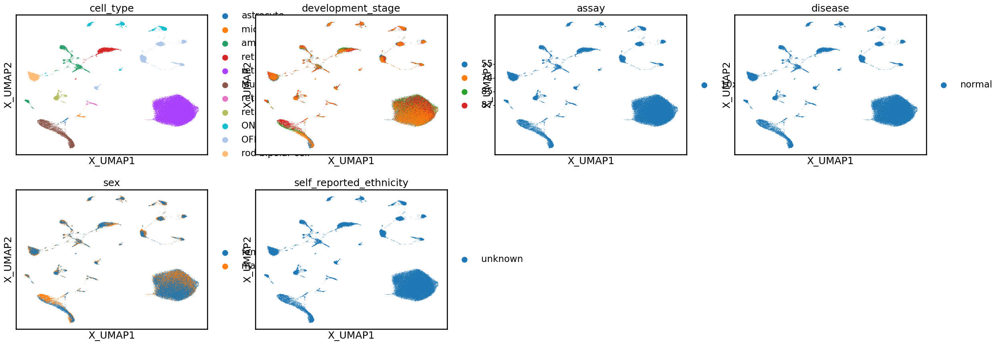

In [6]:
sc.pl.embedding(adata, basis="X_UMAP", color=["cell_type", "development_stage", "assay", "disease", "sex", "self_reported_ethnicity"])

In [33]:
Counter(adata.obs.assay)

Counter({'10x multiome': 51370})

In [32]:
Counter(adata.obs.cell_type)

Counter({'retinal rod cell': 31858,
         'OFF-bipolar cell': 3892,
         'Mueller cell': 3668,
         'amacrine cell': 2722,
         'ON-bipolar cell': 2611,
         'rod bipolar cell': 2319,
         'retinal cone cell': 2211,
         'retina horizontal cell': 1133,
         'retinal ganglion cell': 493,
         'astrocyte': 232,
         'microglial cell': 231})

# good dataset

In [59]:
embed = Embedder(model, how="random expr", max_len=2200, add_zero_genes=0, num_workers=32, pred_embedding = ["cell_type_ontology_term_id"])

Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
IPU available: False, using: 0 IPUs
HPU available: False, using: 0 HPUs


## test dataset

In [45]:
n_adata

AnnData object with n_obs × n_vars = 10000 × 70116
    obs: 'biosample_id', 'donor_id', 'cell_type_ontology_term_id', 'organism_ontology_term_id', 'disease_ontology_term_id', 'tissue_ontology_term_id', 'assay_ontology_term_id', 'cell_type__custom', 'development_stage_ontology_term_id', 'sex_ontology_term_id', 'suspension_type', 'is_primary_data', 'age', 'self_reported_ethnicity_ontology_term_id', 'cell_type', 'assay', 'disease', 'organism', 'sex', 'tissue', 'self_reported_ethnicity', 'development_stage', 'cell_culture', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

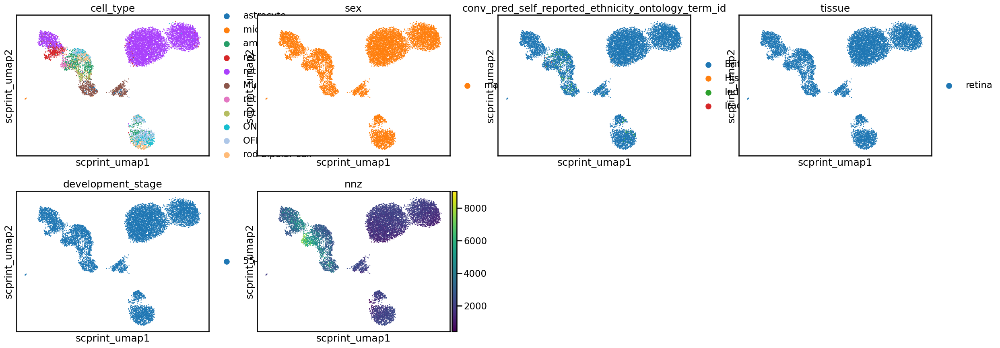

In [41]:
sc.pl.embedding(n_adata, basis="scprint_umap", color=["cell_type", "sex", "conv_pred_self_reported_ethnicity_ontology_term_id", "tissue", 'development_stage', 'nnz'])

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

adding on disk
AnnData object with n_obs × n_vars = 16382 × 512
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in panda

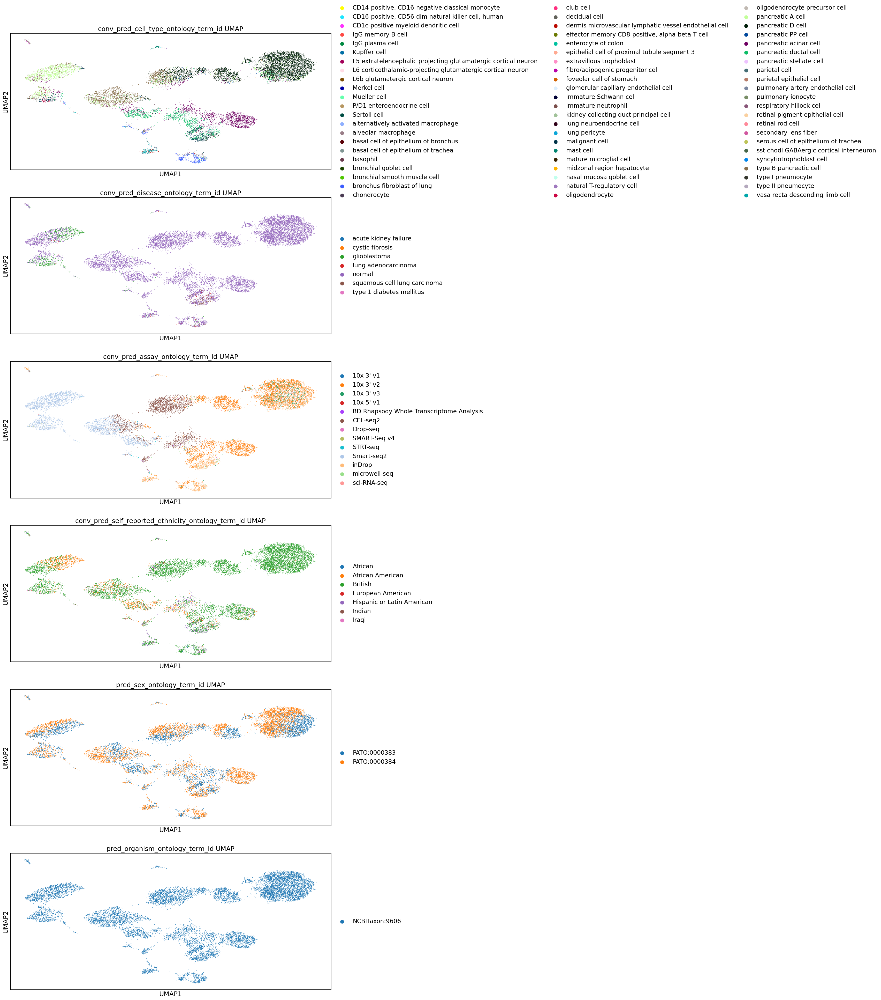

couldn't log to tensorboard
couldn't log to wandb
     organism_ontology_term_id
     accuracy: 1.0
 


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:220: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  disp_grouped = df.groupby('mean_bin')['dispersions']
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

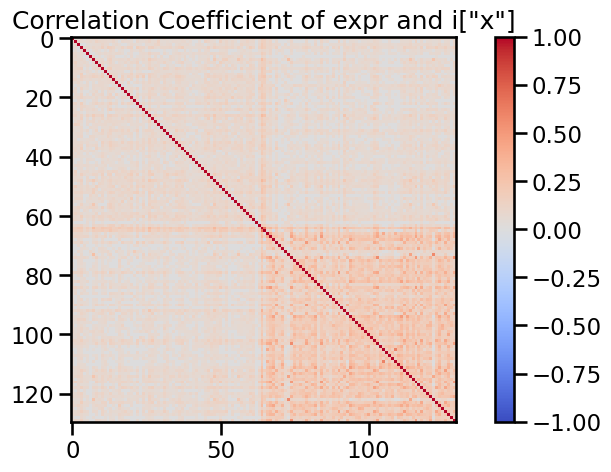

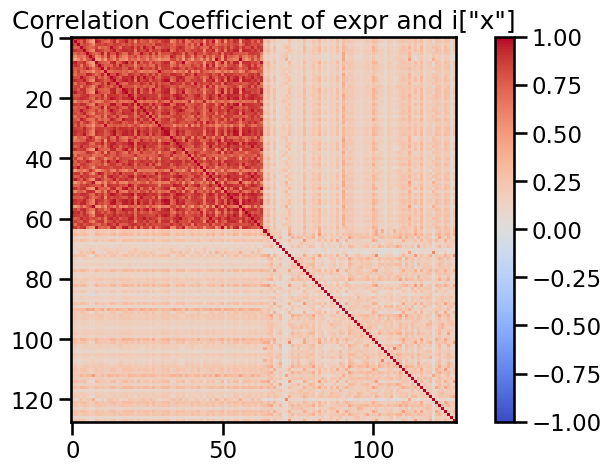

In [60]:
n_adata, metrics = embed(adata.copy()[:], cache=False, output_expression="none")

In [61]:
sc.pp.pca(n_adata)

In [62]:
bm = Benchmarker(
    n_adata,
    batch_key="tech",
    label_key="celltype",
    embedding_obsm_keys=["X_pca", "scprint"],
    n_jobs=6,
)
bm.benchmark()

Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-05-02 15:52:22,601:INFO - isolated labels: no more than 4 batches per label
2024-05-02 15:52:22,681:INFO - Unable to initialize backend 'cuda': 
2024-05-02 15:52:22,683:INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-05-02 15:52:22,690:INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2024-05-02 15:52:22,692:WARNING - An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Metrics:  60%|██████    | 6/10 [00:55<00:28,  7.03s/it, Batch correction: kbet_per_label]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.

INFO     t_cell consists of a single batch or is too small. Skip.                                                  



Metrics:  70%|███████   | 7/10 [01:10<00:28,  9.61s/it, Batch correction: graph_connectivity]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-05-02 15:53:34,537:INFO - isolated labels: no more than 4 batches per label

Metrics:  60%|██████    | 6/10 [03:58<01:36, 24.05s/it, Batch correction: kbet_per_label]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.v

INFO     t_cell consists of a single batch or is too small. Skip.                                                  



Metrics:  70%|███████   | 7/10 [04:15<01:05, 21.97s/it, Batch correction: graph_connectivity]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Embeddings: 100%|██████ | 9/10 [04:17<00:11, 11.73s/it, Batch correction: pcr_comparison]██████████| 2/2 [05:29<00:00, 181.10s/it]██████████| 2/2 [05:29<00:00, 164.73s/it]

                                                                                         

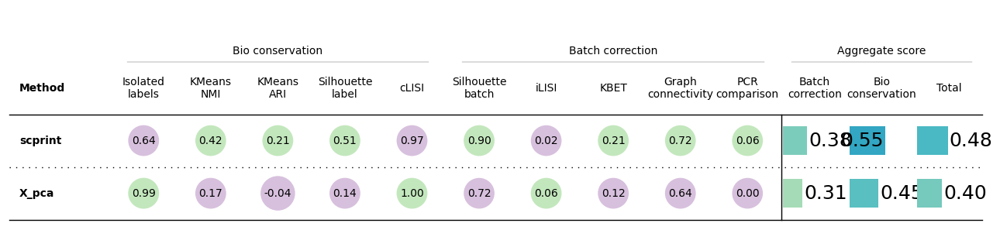

In [64]:
bm.plot_results_table(min_max_scale=False)

In [66]:
n_adata.obs.celltype.value_counts()

celltype
alpha                 5493
beta                  4169
ductal                2142
acinar                1669
delta                 1055
gamma                  699
activated_stellate     464
endothelial            313
quiescent_stellate     193
macrophage              79
mast                    42
epsilon                 32
schwann                 25
t_cell                   7
Name: count, dtype: int64

In [72]:
n_adata.obs.loc[n_adata.obs.celltype=="activated_stellate"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
bronchus fibroblast of lung                           334
decidual cell                                          76
lung pericyte                                           9
pancreatic acinar cell                                  8
pancreatic stellate cell                                8
                                                     ... 
foveolar cell of stomach                                0
glomerular capillary endothelial cell                   0
CD16-positive, CD56-dim natural killer cell, human      0
kidney collecting duct principal cell                   0
immature neutrophil                                     0
Name: count, Length: 66, dtype: int64

In [70]:
n_adata.obs.loc[n_adata.obs.celltype=="macrophage"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
alveolar macrophage                                56
mature microglial cell                              9
CD1c-positive myeloid dendritic cell                6
Kupffer cell                                        2
CD14-positive, CD16-negative classical monocyte     1
                                                   ..
fibro/adipogenic progenitor cell                    0
foveolar cell of stomach                            0
glomerular capillary endothelial cell               0
immature Schwann cell                               0
vasa recta descending limb cell                     0
Name: count, Length: 66, dtype: int64

In [74]:
n_adata.obs.loc[n_adata.obs.celltype=="endothelial"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
vasa recta descending limb cell                           180
dermis microvascular lymphatic vessel endothelial cell     56
pulmonary artery endothelial cell                          32
glomerular capillary endothelial cell                      12
decidual cell                                               7
                                                         ... 
fibro/adipogenic progenitor cell                            0
foveolar cell of stomach                                    0
immature Schwann cell                                       0
CD16-positive, CD56-dim natural killer cell, human          0
immature neutrophil                                         0
Name: count, Length: 66, dtype: int64

In [73]:
n_adata.obs.loc[n_adata.obs.celltype=="gamma"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
pancreatic D cell                               324
type B pancreatic cell                          196
pancreatic A cell                               146
pancreatic ductal cell                           11
malignant cell                                    8
                                               ... 
epithelial cell of proximal tubule segment 3      0
extravillous trophoblast                          0
fibro/adipogenic progenitor cell                  0
foveolar cell of stomach                          0
vasa recta descending limb cell                   0
Name: count, Length: 66, dtype: int64

In [69]:
n_adata.obs.loc[n_adata.obs.celltype=="beta"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
pancreatic D cell                        2544
pancreatic A cell                         720
type B pancreatic cell                    657
malignant cell                             71
pancreatic acinar cell                     42
                                         ... 
fibro/adipogenic progenitor cell            0
foveolar cell of stomach                    0
glomerular capillary endothelial cell       0
immature Schwann cell                       0
vasa recta descending limb cell             0
Name: count, Length: 66, dtype: int64

In [67]:
n_adata.obs.loc[n_adata.obs.celltype=="alpha"].conv_pred_cell_type_ontology_term_id.value_counts()

conv_pred_cell_type_ontology_term_id
pancreatic D cell                                     2256
pancreatic A cell                                     1359
type B pancreatic cell                                1183
pancreatic acinar cell                                 260
pancreatic ductal cell                                 152
                                                      ... 
foveolar cell of stomach                                 0
glomerular capillary endothelial cell                    0
immature Schwann cell                                    0
CD16-positive, CD56-dim natural killer cell, human       0
vasa recta descending limb cell                          0
Name: count, Length: 66, dtype: int64

In [70]:
n_adata

AnnData object with n_obs × n_vars = 198957 × 70116
    obs: 'Sample ID_prep', 'assay_ontology_term_id', 'cell_type_ontology_term_id', 'disease_ontology_term_id', 'self_reported_ethnicity_ontology_term_id', 'is_primary_data', 'organism_ontology_term_id', 'sex_ontology_term_id', 'tissue_ontology_term_id', 'n_genes', 'fpr', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sample ID', 'donor_id', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'scrublet', 'scrublet_score', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'channel', 'developm

In [22]:
{i:j for i,j in n_adata.obs.conv_pred_cell_type_ontology_term_id.value_counts().items() if j>10}

{'lung ciliated cell': 7151,
 'endothelial cell of lymphatic vessel': 3906,
 'alveolar macrophage': 3590,
 'mast cell': 3378,
 'CD16-positive, CD56-dim natural killer cell, human': 2574,
 'type II pneumocyte': 2215,
 'kidney collecting duct principal cell': 1112,
 'non-classical monocyte': 1015,
 'CD8-positive, alpha-beta cytotoxic T cell': 926,
 'CD16-negative, CD56-bright natural killer cell, human': 656,
 'alternatively activated macrophage': 578,
 'regulatory T cell': 561,
 'endothelial tip cell': 534,
 'type I pneumocyte': 526,
 'intestinal crypt stem cell of large intestine': 450,
 'conventional dendritic cell': 394,
 'kidney loop of Henle thin ascending limb epithelial cell': 355,
 'mature NK T cell': 321,
 'myofibroblast cell': 285,
 'club cell': 228,
 'Sertoli cell': 191,
 'myelocyte': 178,
 'immature neutrophil': 160,
 'naive B cell': 140,
 'chondrocyte': 103,
 'effector memory CD8-positive, alpha-beta T cell': 98,
 'kidney loop of Henle thick ascending limb epithelial cell':

In [24]:
n_adata.obs.loc[n_adata.obs.conv_pred_cell_type_ontology_term_id=="lung ciliated cell"].cell_type.value_counts()

cell_type
Type 2                  2554
Ciliated                1739
Basal 2                 1192
Secretory               1001
Macrophage               414
Basal 1                   66
Dendritic cell            48
Fibroblast                40
Lymphatic                 37
Endothelium               30
Ionocytes                 14
Neutrophil_CD14_high       9
Mast cell                  3
Type 1                     2
B cell                     2
Neutrophils_IL1R2          0
T/NK cell                  0
Name: count, dtype: int64

In [23]:
n_adata.obs.loc[n_adata.obs.conv_pred_cell_type_ontology_term_id=="mast cell"].cell_type.value_counts()

cell_type
Macrophage              874
Mast cell               666
B cell                  410
T/NK cell               210
Endothelium             199
Secretory               161
Dendritic cell          137
Neutrophil_CD14_high    132
Type 1                  126
Type 2                  125
Neutrophils_IL1R2       102
Basal 2                 101
Fibroblast               58
Basal 1                  30
Ciliated                 29
Lymphatic                18
Ionocytes                 0
Name: count, dtype: int64

In [27]:
n_adata.obs.loc[n_adata.obs.conv_pred_cell_type_ontology_term_id=="alveolar macrophage"].cell_type.value_counts()
# pneumocyte: CL:1000271
# type 2 CL:0002063

cell_type
Macrophage              2974
Dendritic cell           191
Neutrophil_CD14_high     185
B cell                    96
Neutrophils_IL1R2         37
Secretory                 35
Ciliated                  19
Mast cell                 14
Type 2                    14
Type 1                     9
Endothelium                8
T/NK cell                  7
Lymphatic                  1
Basal 1                    0
Ionocytes                  0
Fibroblast                 0
Basal 2                    0
Name: count, dtype: int64

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/lightning/pytorch/loops/prediction_loop.py:234: UserWarning: predict returned None if it was on purpose, ignore this warning...
  self._warning_cache.warn("predict returned None if it was on purpose, ignore this warning...")
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 16382 × 128
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

couldn't log to tensorboard
couldn't log to wandb
metrics for this dataset of size: 16382
     organism_ontology_term_id
     accuracy: 1.0
 


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 64 × 128
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

couldn't log to tensorboard
couldn't log to wandb


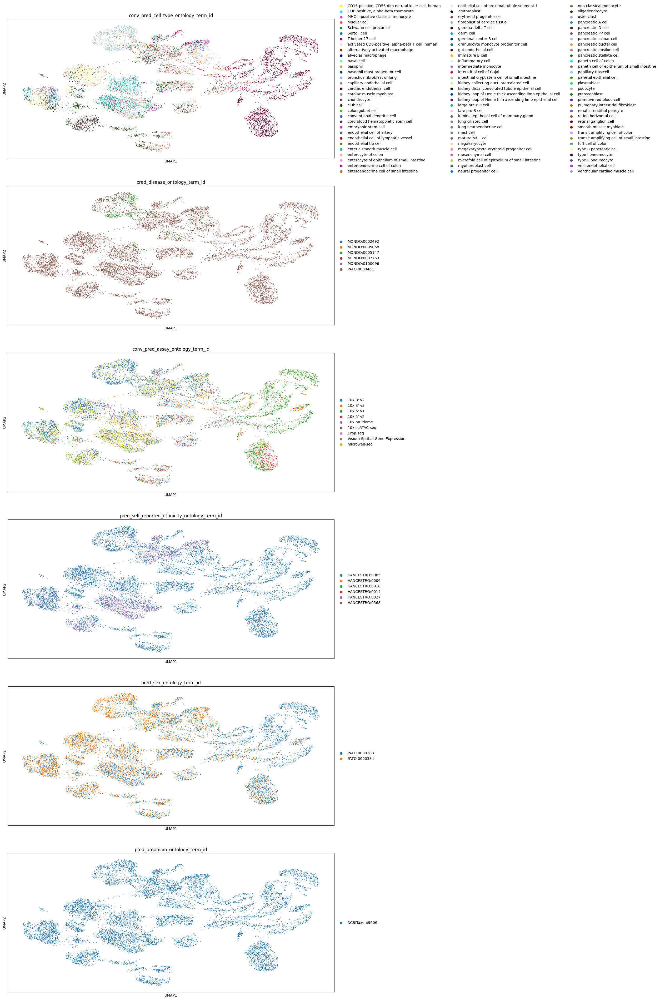

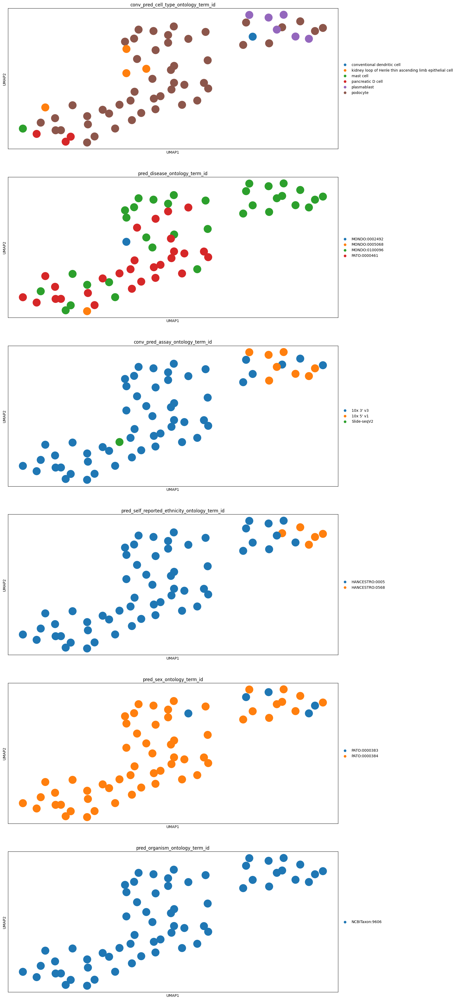

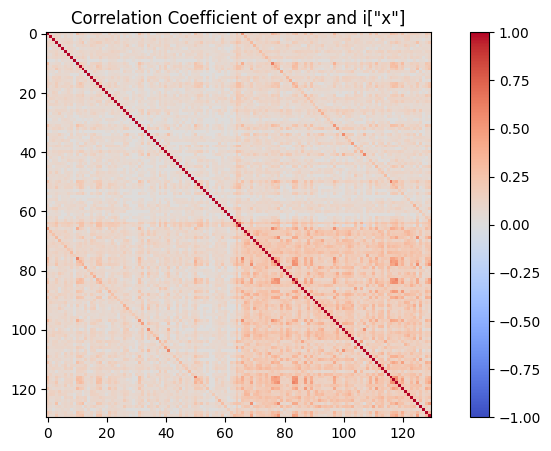

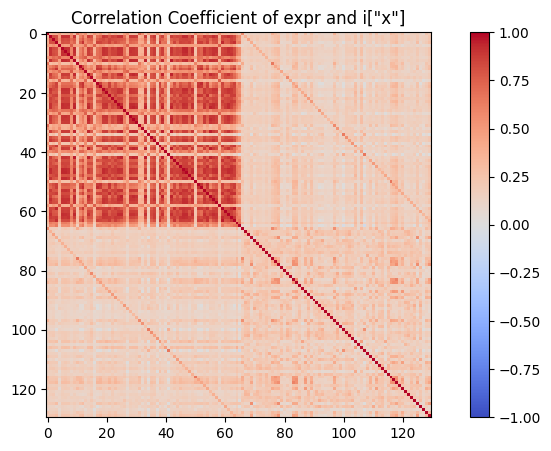

In [10]:
n_adata = embed(adata.copy())

In [16]:
n_adata.obs['tech'].value_counts()

tech
inDrop3       3605
smartseq2     2394
celseq2       2285
inDrop1       1937
inDrop2       1724
smarter       1492
inDrop4       1303
celseq        1004
fluidigmc1     638
Name: count, dtype: int64

In [21]:
import bionty as bt

In [22]:
obj = bt.CellType.public(organism="all")
{i: obj.search(i, field="name").ontology_id.iloc[0] for i in set(n_adata.obs['celltype'])}

{'gamma': 'CL:0000932',
 'beta': 'CL:0000790',
 'epsilon': 'CL:0005019',
 'acinar': 'CL:0000622',
 'delta': 'CL:0000801',
 'schwann': 'CL:0002375',
 'activated_stellate': 'CL:0001048',
 'alpha': 'CL:0000897',
 'mast': 'CL:0000856',
 'quiescent_stellate': 'CL:0002322',
 't_cell': 'CL:0000084',
 'endothelial': 'CL:0000115',
 'ductal': 'CL:0002079',
 'macrophage': 'CL:0000235'}

In [25]:
fine = {"gamma": "CL:0000453",
"beta": "CL:0000169", # "CL:0008024"
"epsilon": "CL:0005019", # "CL:0008024"
"acinar": "CL:0000622",
'delta': 'CL:0000173', #"CL:0008024"
'schwann': 'CL:0002573', # "CL:0000125"
'activated_stellate': 'CL:0000057',
'alpha': 'CL:0000171',# "CL:0008024"
'mast': 'CL:0000097',
'quiescent_stellate': 'CL:0000057',
't_cell': 'CL:0000084',
'endothelial': 'CL:0000115',
'ductal': 'CL:0002079', #CL:0000068
'macrophage': 'CL:0000235',
}
coarse = {
"gamma": "CL:0000453",
"beta": "CL:0008024",
"epsilon": "CL:0008024",
"acinar": "CL:0000622",
'delta': "CL:0008024",
'schwann': "CL:0000125",
'activated_stellate': 'CL:0000057',
'alpha': "CL:0008024",
'mast': 'CL:0000097',
'quiescent_stellate': 'CL:0000057',
't_cell': 'CL:0000084',
'endothelial': 'CL:0000115',
'ductal': "CL:0000068",
'macrophage': 'CL:0000235',
}

In [46]:
translate({k:n for k,n in n_adata.obs['pred_cell_type_ontology_term_id'].value_counts().items() if n>20})

{'retinal ganglion cell': 3538,
 'lung ciliated cell': 1904,
 'pancreatic A cell': 1262,
 'type B pancreatic cell': 1195,
 'club cell': 1135,
 'pancreatic acinar cell': 971,
 'pancreatic D cell': 737,
 'interstitial cell of Cajal': 546,
 'enterocyte of colon': 519,
 'epithelial cell of proximal tubule segment 1': 415,
 'cardiac muscle myoblast': 372,
 'pancreatic ductal cell': 371,
 'Sertoli cell': 266,
 'endothelial cell of artery': 214,
 'granulocyte monocyte progenitor cell': 202,
 'neural progenitor cell': 199,
 'paneth cell of epithelium of small intestine': 170,
 'endothelial cell of lymphatic vessel': 168,
 'enteroendocrine cell of colon': 155,
 'fibroblast of cardiac tissue': 151,
 'type II pneumocyte': 143,
 'kidney loop of Henle thin ascending limb epithelial cell': 141,
 'gut endothelial cell': 132,
 'MHC-II-positive classical monocyte': 113,
 'erythroid progenitor cell': 110,
 'pancreatic stellate cell': 87,
 'myofibroblast cell': 67,
 'oligodendrocyte': 66,
 'mature NK T c

In [41]:
n_adata.obs[n_adata.obs['pred_cell_type_ontology_term_id'] == "CL:0000169"].celltype.value_counts()

celltype
beta                  1098
alpha                   73
gamma                   11
delta                    5
ductal                   3
quiescent_stellate       3
acinar                   1
activated_stellate       1
endothelial              0
epsilon                  0
macrophage               0
mast                     0
schwann                  0
t_cell                   0
Name: count, dtype: int64

In [38]:
n_adata.obs['cell_type_ontology_term_id'] = n_adata.obs['celltype'].replace(coarse)

/tmp/ipykernel_49074/357503150.py:1: FutureWarning: The behavior of Series.replace (and DataFrame.replace) with CategoricalDtype is deprecated. In a future version, replace will only be used for cases that preserve the categories. To change the categories, use ser.cat.rename_categories instead.
  n_adata.obs['cell_type_ontology_term_id'] = n_adata.obs['celltype'].replace(coarse)


In [47]:
for label in embed.model.labels:
    res = []
    if label not in n_adata.obs.columns:
        continue
    class_topred = embed.model.label_decoders[label].values()
    if label in embed.model.cls_hierarchy:
        class_groupings = {
            k: [
                i.ontology_id
                for i in bt.CellType.filter(ontology_id=k).first().children.all()
            ]
            for k in set(n_adata.obs[label].unique()) - set(class_topred)
        }
    for pred, true in n_adata.obs[["pred_" + label, label]].values:
        if pred == true:
            res.append(True)
            continue

        if label in embed.model.cls_hierarchy:
            if true in class_groupings:
                res.append(pred in class_groupings[true])
                continue
            elif true not in class_topred:
                raise ValueError(f"true label {true} not in available classes")
        elif true not in class_topred:
            raise ValueError(f"true label {true} not in available classes")
        res.append(False)
    print("    ", label)
    print("     accuracy:", sum(res) / len(res))
    print(" ")

     cell_type_ontology_term_id
     accuracy: 0.196984495177634
 
 cell_type_ontology_term_id
     accuracy: 0.196984495177634
 
     organism_ontology_term_id
     accuracy: 1.0
 


In [19]:
translate(n_adata.obs['celltype'].unique().tolist())

{'gamma': 'mature Vgamma2-positive thymocyte',
 'beta': 'DN3 thymocyte',
 'epsilon': 'mammotroph',
 'acinar': 'epithelial cell of prostatic acinus',
 'delta': 'CD27-negative gamma-delta T cell',
 'schwann': 'Schwann cell precursor',
 'activated_stellate': 'activated CD4-negative, CD8-negative type I NK T cell',
 'alpha': 'pancreatic A cell',
 'mast': 'mucosal type mast cell',
 'quiescent_stellate': 'embryonic stem cell',
 't_cell': 'T cell',
 'endothelial': 'endothelial cell of pericentral hepatic sinusoid',
 'ductal': 'epithelial cell of prostatic duct',
 'macrophage': 'central nervous system macrophage'}

In [ ]:
n_adata

AnnData object with n_obs × n_vars = 16382 × 70116
    obs: 'tech', 'celltype', 'size_factors', 'organism_ontology_term_id', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'leiden'
    var: 'uid', 'symbol', 'stable_id', 'ncbi_gene_ids', 'biotype', 'description', 'synonyms', 'organism_id', 'public_source_id', 'created_at', 'updated_at', 'created_by_id', 'mt', 'ribo', 'hb', 'organism', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_c

In [ ]:
sc.pp.pca(n_adata)

In [ ]:
bm = Benchmarker(
    n_adata,
    batch_key="tech",
    label_key="celltype",
    embedding_obsm_keys=["X_pca", "scprint"],
    n_jobs=6,
)
bm.benchmark()

Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-03-04 17:58:58,209:INFO - isolated labels: no more than 4 batches per label
2024-03-04 17:58:58,273:INFO - Unable to initialize backend 'cuda': 
2024-03-04 17:58:58,275:INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-03-04 17:58:58,318:INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2024-03-04 17:58:58,321:WARNING - An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Metrics:  60%|██████    | 6/10 [00:55<00:26,  6.69s/it, Batch correction: kbet_per_label]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.

INFO     t_cell consists of a single batch or is too small. Skip.                                                  



Metrics:  70%|███████   | 7/10 [01:08<00:26,  9.00s/it, Batch correction: graph_connectivity]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Metrics:   0%|          | 0/10 [00:00<?, ?it/s]
                                                                                         
Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-03-04 18:00:07,870:INFO - isolated labels: no more than 4 batches per label

Metrics:  60%|██████    | 6/10 [02:14<00:54, 13.64s/it, Batch correction: kbet_per_label]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  comp_size = pd.v

INFO     t_cell consists of a single batch or is too small. Skip.                                                  



Metrics:  70%|███████   | 7/10 [02:27<00:41, 13.74s/it, Batch correction: graph_connectivity]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_graph_connectivity.py:30: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.
  tab = pd.value_counts(comps)

Embeddings: 100%|██████ | 9/10 [02:28<00:07,  7.28s/it, Batch correction: pcr_comparison]██████████| 2/2 [03:38<00:00, 116.15s/it]██████████| 2/2 [03:38<00:00, 109.18s/it]

                                                                                         

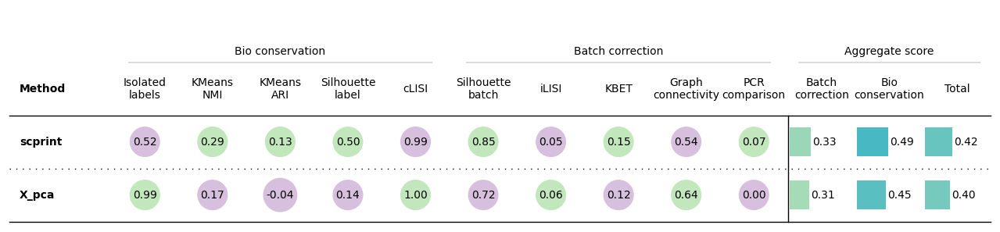

In [ ]:
bm.plot_results_table(min_max_scale=False)

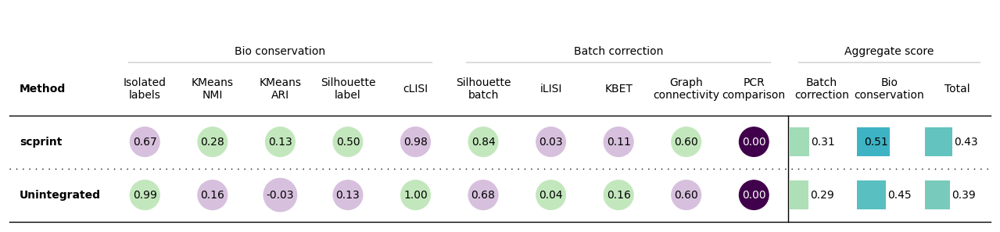

In [ ]:
bm.plot_results_table(min_max_scale=False)

## results from running it on most famous methods

In [ ]:
# lung

LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 32251 × 256
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

couldn't log to tensorboard
couldn't log to wandb


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/preprocessing/_highly_variable_genes.py:61: UserWarning: `flavor='seurat_v3'` expects raw count data, but non-integers were found.
  warnings.warn(
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]


Predicting: 0it [00:00, ?it/s]

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:183: ImplicitModificationWarning: Transforming to str index.
  warnings.warn("Transforming to str index.", ImplicitModificationWarning)


         Falling back to preprocessing with `sc.pp.pca` and default params.


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/anndata/_core/anndata.py:522: FutureWarning: The dtype argument is deprecated and will be removed in late 2024.
  warnings.warn(


AnnData object with n_obs × n_vars = 64 × 256
    obs: 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'leiden'
    uns: 'neighbors', 'umap', 'leiden'
    obsm: 'X_pca', 'X_umap'
    obsp: 'distances', 'connectivities'


/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

couldn't log to tensorboard
couldn't log to wandb


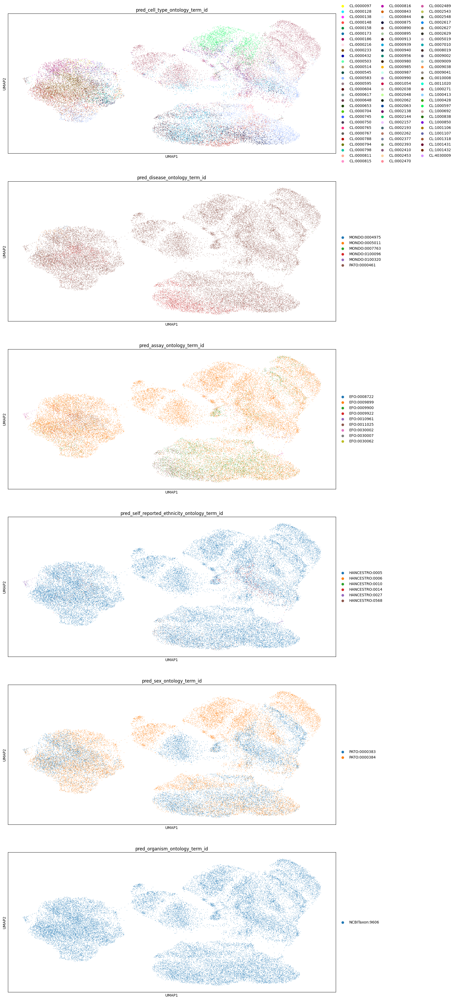

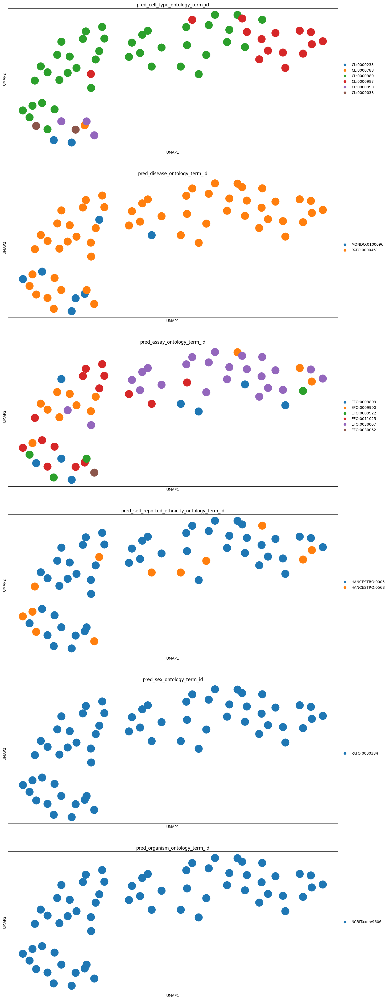

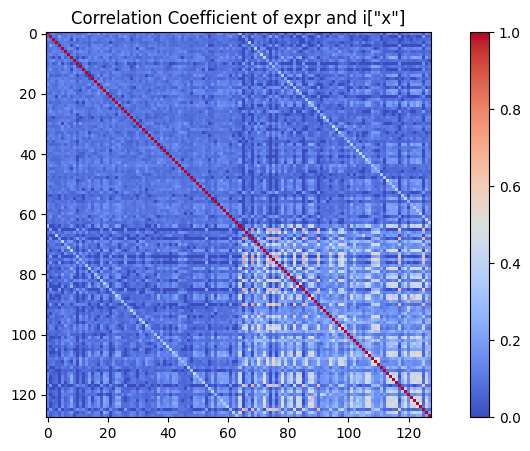

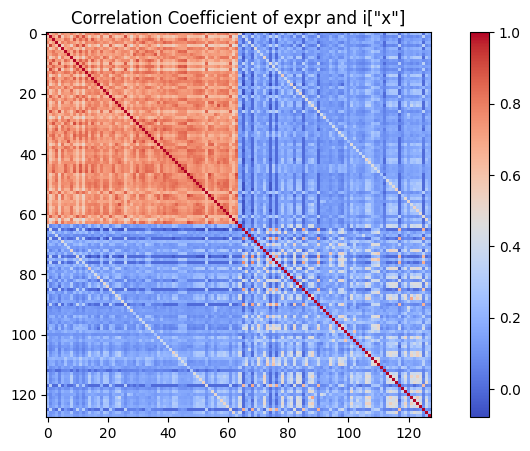

In [ ]:
n_adata = embed(adata.copy())

... storing 'organism_ontology_term_id' as categorical
... storing 'symbol' as categorical
... storing 'ncbi_gene_ids' as categorical
... storing 'biotype' as categorical
... storing 'description' as categorical
... storing 'synonyms' as categorical
... storing 'organism' as categorical
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/sca

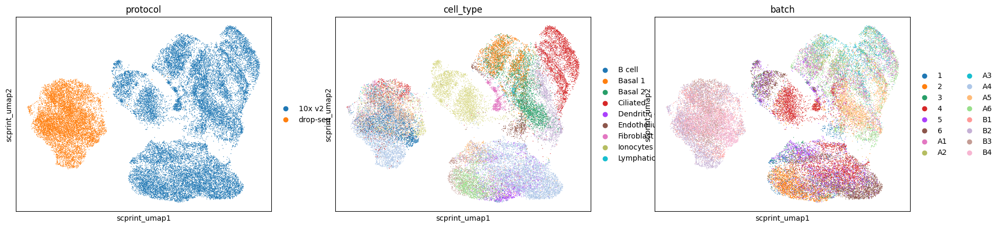

In [ ]:
sc.pl.embedding(n_adata,basis="scprint_umap" ,color=["protocol", "cell_type", "batch"])

In [28]:
n_adata

AnnData object with n_obs × n_vars = 32251 × 70116
    obs: 'dataset', 'location', 'nGene', 'nUMI', 'patientGroup', 'percent.mito', 'protocol', 'sanger_type', 'size_factors', 'sampling_method', 'batch', 'cell_type', 'donor', 'organism_ontology_term_id', 'nnz', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_20_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'total_counts_hb', 'log1p_total_counts_hb', 'pct_counts_hb', 'outlier', 'mt_outlier', 'pred_cell_type_ontology_term_id', 'pred_disease_ontology_term_id', 'pred_assay_ontology_term_id', 'pred_self_reported_ethnicity_ontology_term_id', 'pred_sex_ontology_term_id', 'pred_organism_ontology_term_id', 'conv_pred_cell_type_ontology_term_id', 'conv_pred_disease_ontology_term_id', 'conv_pred_assay_ontology_term_id', 'conv_pred_self_reported_ethnicity_ontology_term_id', 'leiden'
    var: 'uid', 'symb

In [29]:
sc.pp.pca(n_adata)

/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(values.map(color_map))
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:394: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(
/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scanpy/plotting/_tools/scatterplots.py:1251: FutureWarning: The default value of 'ignore' for the `na_action` parameter in pandas.Categorical.map is deprecated and will be changed to 'None' in a future version. Please set na_action to the desired value to avoid seeing this warning
  color_vector = pd.Categorical(

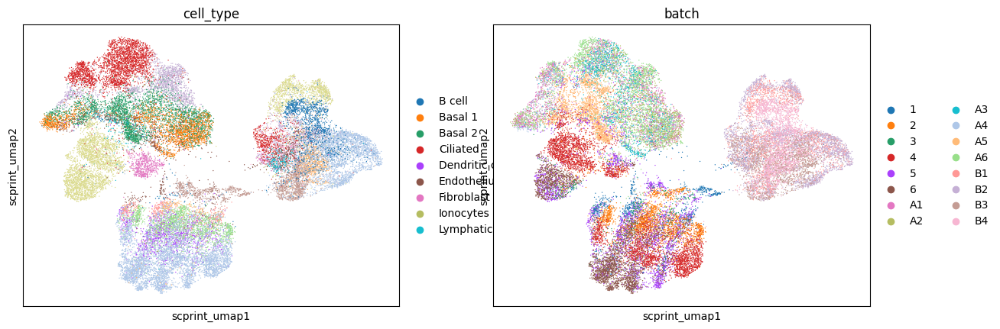

In [32]:
sc.pl.embedding(n_adata, color=['cell_type', 'batch'], basis="scprint_umap")

In [30]:
bm = Benchmarker(
    n_adata,
    batch_key="batch",
    label_key="cell_type",
    embedding_obsm_keys=["X_pca", "scprint"],
    n_jobs=8,
)
bm.benchmark()

Metrics:   0%|          | 0/10 [00:00<?, ?it/s, Bio conservation: isolated_labels]2024-03-08 15:59:38,778:INFO - isolated labels: no more than 4 batches per label
2024-03-08 15:59:38,862:INFO - Unable to initialize backend 'cuda': 
2024-03-08 15:59:38,863:INFO - Unable to initialize backend 'rocm': module 'jaxlib.xla_extension' has no attribute 'GpuAllocatorConfig'
2024-03-08 15:59:38,869:INFO - Unable to initialize backend 'tpu': INTERNAL: Failed to open libtpu.so: libtpu.so: cannot open shared object file: No such file or directory
2024-03-08 15:59:38,871:WARNING - An NVIDIA GPU may be present on this machine, but a CUDA-enabled jaxlib is not installed. Falling back to cpu.

Metrics:  60%|██████    | 6/10 [02:24<01:04, 16.10s/it, Batch correction: kbet_per_label]/home/ml4ig1/miniconda3/envs/scprint/lib/python3.10/site-packages/scib_metrics/_kbet.py:181: FutureWarning: pandas.value_counts is deprecated and will be removed in a future version. Use pd.Series(obj).value_counts() instead.

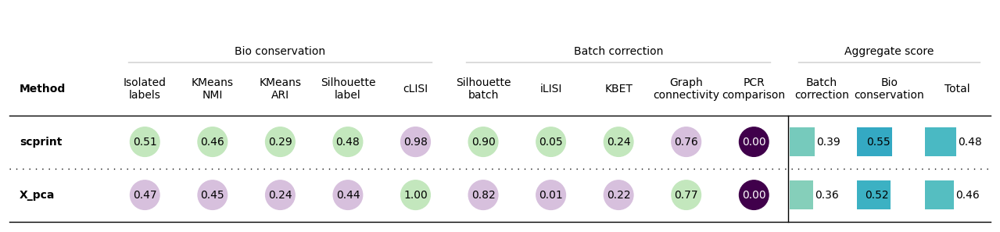

In [33]:
bm.plot_results_table(min_max_scale=False)

![](https://scib-metrics.readthedocs.io/en/stable/_images/72fe472fdb279e95aba93bd88bf06ad186ff74cc30d6ec63c47b0025da83ccc0.png)

In [ ]:
## load a random dataset

In [ ]:
## do scGPT finetuning task (reusing the helper functions I have) and the notebook that they provide

In [ ]:
## create a task/function for scPrint

In [ ]:
## try to do an embedding from the regulon / single cell type matrix outputted by scenic

In [ ]:
## push it to a function on BenGRN